# Generative Adversarial Networks with applications in microstructure modelling: Part 2

### 2024 CMIT Summer Research Internship Programme, University of Liverpool, 19 July 2024


#### Maciej Buze, Heriot-Watt University



## Recap

### Aims

A gentle hands-on introducton to
1. Microstructure modelling as a mathematical imaging problem (DONE)
1. Generative Adversarial Networks - a well-known generative AI framework

### Structure
- Two ~2-hour lectures: (i) Tuesday 16 July 9:30-11:30 BST, (ii) Friday 19 July 9:30-11:30 BST
- Blend of theory and live coding
- Modest homework in the form of a Jupyter notebook
- Reproducible code to play around with

## Introduction to Generative Adversarial Networks

- Maths intro based on : Wang, Y. (2020). A mathematical introduction to generative adversarial nets (GAN). arXiv preprint arXiv:2009.00169. [[LINK]](https://arxiv.org/abs/2009.00169)
    
- Hands-on tutorial based on:
   - Vanilla GANs tutorial: https://github.com/tomsercu/gan-tutorial-pytorch
   - Data preparation: https://www.learnpytorch.io/04_pytorch_custom_datasets/
    

## Introduction to Generative Adversarial Networks

<br><br>

<h4><p style="text-align: center;">"Suppose we are given a <u>data set of objects</u> with certain <u>degree of consistency</u>, for example, a collection of images of cats, or Van Gogh painting, or microstructure images, or ... <br><br> Can we artificially generate <u>similar</u> objects?" </p></h4>



## Introduction to Generative Adversarial Networks

- "Objects" = (collections of) greyscale images = a set $\mathcal{X}$ of points $\mathbf{x} \in \mathbb{R}^n$ where $n$ is the number of pixels. To each pixel we assign a greyscale value between 0 and 1. (or equivalently between -1 and 1).
- "degree of consistency" - objects are samples generated from a common probability distribution $p\,\colon \mathbb{R}^n \to \mathbb{R}_+$. This distribution is unknown, intractable. We just have samples from it.
- "similarity" - find a probability distribution $q \,\colon \mathbb{R}^n \to \mathbb{R}_+$ such that $q$ is similar to the unknown $p$.

## Introduction to Generative Adversarial Networks

We will construct $q$ using neural networks:
- start with a known simple probability distribution $\eta(\mathbf z) \sim \mathcal{N}(0,I_d)$ where $d=100$ (we can choose $d$, this is a typical choice).
- create a GENERATOR neural network $G_{\theta}\,\colon\,\mathbb{R}^d \to \mathbb{R}^n$ where $\theta$ is the set of parameters. Define $q_{\theta}$ as the distribution of $G_{\theta}( \mathbf z)$ (new generated images)
- We want to optimise parameters $\theta$ so that $q_{\theta}$ is close to $p$.
- We do so by defining another neural network, the DISCRIMINATOR $D_{\omega}\,\colon \mathbb{R}^n \to [0,1]$ with parameters $\omega$, which clasifies the images as to whether they are REAL or FAKE.
- Objective of $D_{\omega}$ is to have $D_{\omega}(x) \approx 1$ when $\mathbf x \in \mathcal{X}$ (real data) and $D_{\omega}(G_{\theta}(\mathbf z)) \approx 0$ (fake new generated data).
- Objective of $G_{\theta}$ is to fool $D_{\omega}$ so that $D_{\omega}(G_{\theta}(\mathbf z)) \approx 1$.

## Introduction to Generative Adversarial Networks

- We have two "actors" with competing interests, it is a so-called "min-max" game:
$$
\min_{\theta} \max_{\omega} V(D_{\omega}, G_{\theta})
$$
where
$$
V(D_{\omega}, G_{\theta}) \approx \frac{1}{m} \sum_{i=1}^m \Big(\log (D_{\omega}(\mathbf{x}_i)) + \log(1-D_{\omega}(G_{\theta}(\mathbf z_i)) \Big)
$$
with $\{G_{\theta}(\mathbf z_i)\}_{i=1}^m$ a batch of $m$ fake images and $\{\mathbf x_i\}_{i=1}^m$ is a batch of $m$ real images.

For $y \in (0,1)$, $\log(y)$ is maximised as $y\to 1$ and $\log(1-y)$ maximized as $y \to 0$ and minimized as $y \to 1$.

- At each optimisation step, new batches are created.
- One first updates parameters $\omega$ to be a bit more optimal, then updates $\theta$ to be a bit more optimal.
- This is done using stochastic gradient algorithms.
- Final outcome: the fake generator is so good that $D_{\omega}(G_{\theta}(\mathbf z)) \to 0.5$ (it cannot tell which is fake which is true, even though it is an expert at making such judgements).

## Hands-on example

## Loading relevant libraries and data

In [31]:
pip install PyAPD

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.5/92.5 kB 3.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.6/59.6 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 238.8/238.8 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.3/100.3 kB 7.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-

In [32]:
import torch # go-to machine learning Python library
from torch import nn # torch's neural network module
import torchvision # torch-based library for computer vision problems
from torch.utils.data import DataLoader # module to feed data to neural networks
from torchvision import datasets, transforms # module for defining and transforming torch-compatible datasets
#import torch.nn.functional as F
import torchvision.utils as vutils # visualisation utility
import PyAPD

# loading the data
import os
import requests
import zipfile
from pathlib import Path

import random # random number generator
from PIL import Image # opening images from files

import numpy as np # linear algebra etc
import matplotlib.pyplot as plt # plotting

# using a GPU if available
device = "cuda" if torch.cuda.is_available() else "cpu"
device

[KeOps] Warning : Cuda libraries were not detected on the system or could not be loaded ; using cpu only mode


'cpu'

In [2]:
# Setup path to data folder
data_path = Path("data/") # path to data folder
image_path = data_path / "apd_data" # path to the specific subfolder
train_dir = image_path / "train" # set training data path (all of data in our case)
# If the image folder doesn't exist, download it and prepare it...
if image_path.is_dir():
    print(f"{image_path} directory exists.")
else:
    print(f"Did not find {image_path} directory, creating one...")
    image_path.mkdir(parents=True, exist_ok=True)
    # Download PyAPD data
    with open(data_path / "apd_data.zip", "wb") as f:
        request = requests.get("https://github.com/mbuze/GAN_microstructures_Summer_School/raw/main/data/apd_data.zip")
        print("Downloading PyAPD data...")
        f.write(request.content)
    # Unzip the data
    with zipfile.ZipFile(data_path / "apd_data.zip", "r") as zip_ref:
        print("Unzipping PyAPD data...")
        zip_ref.extractall(image_path)

Did not find data/apd_data directory, creating one...
Unzipping PyAPD data...


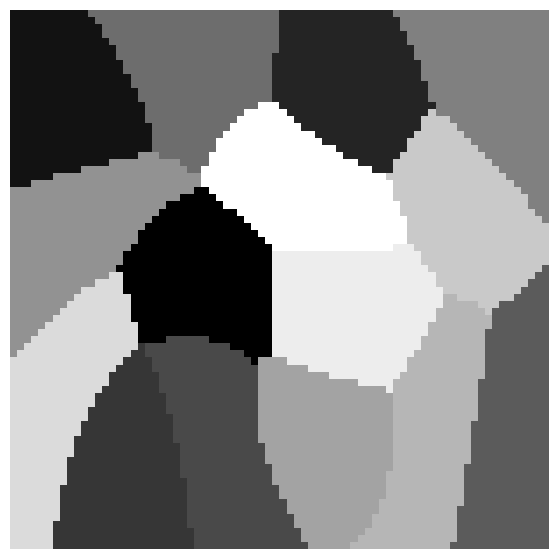

In [3]:
# Set seed
random.seed(41) # <- try changing this and see what happens
# 1. Get all image paths (* means "any combination")
image_path_list = list(image_path.glob("*/*/*.png"))
#2. Get random image path
random_image_path = random.choice(image_path_list)
# 3. Get image class from path name (the image class is the name of the directory where the image is stored)
image_class = random_image_path.parent.stem
# 4. Open image
img = Image.open(random_image_path)
# Turn the image into an array
img_as_array = np.asarray(img)
# Plot the image with matplotlib
plt.figure(figsize=(10, 7))
plt.imshow(img_as_array)#,cmap=plt.cm.gray)
plt.axis(False);

## Passing data to torchvision

In [4]:
# Transforming data before passing it to torchvision
data_transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1), # make sure we work with grayscale
    transforms.ToTensor(), # this also converts all pixel values from 0 to 255 to be in [0,1]
    transforms.Normalize((0.5,), (0.5,)) # shift the data to be [-1,1]
])

bs = 16 # batch size (dimension parameter m)
g_dim = 100 # input for G (dimension parameter d)

In [5]:
dataset_pyapd = datasets.ImageFolder(root=train_dir, # target folder of images
                                  transform=data_transform, # transforms to perform on data (images)
                                  target_transform=None) # transforms to perform on labels (not applicable)

# Turn train and test Datasets into DataLoaders
dataloader_pyapd = DataLoader(dataset=dataset_pyapd,
                              batch_size=bs, # how many samples per batch?
                              #num_workers=1, # how many subprocesses to use for data loading? (higher = more)
                              shuffle=True) # shuffle the data?

In [6]:
len(dataloader_pyapd)

886

In [7]:
len(dataset_pyapd)

14164

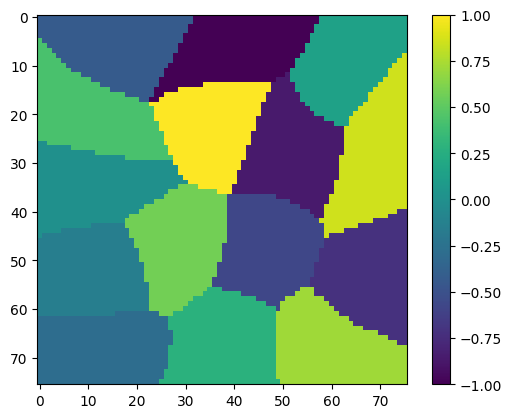

In [8]:
ix=14
x, _ = dataset_pyapd[ix]
plt.imshow(x.squeeze().numpy())
plt.colorbar()

In [10]:
x.shape

torch.Size([1, 76, 76])

In [9]:
def show_imgs(x, new_fig=True):
    grid = vutils.make_grid(x.detach().cpu(), nrow=8, normalize=True, pad_value=0.3)
    grid = grid[0,:,:][:,:,None]
    if new_fig:
        plt.figure()
    plt.imshow(grid.numpy(),cmap = 'viridis')

In [11]:
# How you can get a batch of images from the dataloader:
xbatch, _ = next(iter(dataloader_pyapd))
M = xbatch.shape[-1] # find number of pixels
xbatch.shape

torch.Size([16, 1, 76, 76])

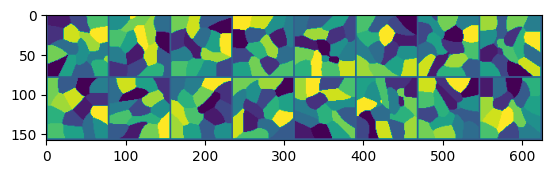

In [12]:
show_imgs(xbatch)

## Defining neural networks

In [13]:
class Discriminator(torch.nn.Module): # 2-layer discriminator neural network
    def __init__(self, inp_dim=M**2): # inp_dim = 76x76 = 5776
        super(Discriminator, self).__init__()
        self.fc1 = nn.Linear(inp_dim, 128) # first layer
        self.nonlin1 = nn.LeakyReLU(0.2) # nonlinearity inside first layer
        self.fc2 = nn.Linear(128, 1) # second layer
    def forward(self, x):
        x = x.view(x.size(0), M**2)
        h = self.nonlin1(self.fc1(x))
        out = self.fc2(h)
        out = torch.sigmoid(out) # final transform to output values in [0,1]
        return out

In [14]:
class Generator(nn.Module): # 2-layer generator neural network
    def __init__(self, z_dim=g_dim): # g_dim = 100 (our choice, 100 is typical)
        super(Generator, self).__init__()
        self.fc1 = nn.Linear(z_dim, 128) # first layer
        self.nonlin1 = nn.LeakyReLU(0.2) # nonlinearity inside first layer
        self.fc2 = nn.Linear(128, M**2) # second layer
    def forward(self, x):
        h = self.nonlin1(self.fc1(x))
        out = self.fc2(h)
        out = torch.tanh(out) # final transform to output values in the range [-1, 1]
        # convert to image
        out = out.view(out.size(0), 1, M, M)
        return out

In [15]:
# instantiate a Generator and Discriminator according to their class definition.
D = Discriminator()
print(D)
G = Generator()
print(G)

Discriminator(
  (fc1): Linear(in_features=5776, out_features=128, bias=True)
  (nonlin1): LeakyReLU(negative_slope=0.2)
  (fc2): Linear(in_features=128, out_features=1, bias=True)
)
Generator(
  (fc1): Linear(in_features=100, out_features=128, bias=True)
  (nonlin1): LeakyReLU(negative_slope=0.2)
  (fc2): Linear(in_features=128, out_features=5776, bias=True)
)


In [17]:
for name, p in D.named_parameters():
    print(name,p.shape)

fc1.weight torch.Size([128, 5776])
fc1.bias torch.Size([128])
fc2.weight torch.Size([1, 128])
fc2.bias torch.Size([1])


In [18]:
for name, p in G.named_parameters():
    print(name, p.shape)

fc1.weight torch.Size([128, 100])
fc1.bias torch.Size([128])
fc2.weight torch.Size([5776, 128])
fc2.bias torch.Size([5776])


Each constituent function is of the form

$$
f_{c_i}(\mathbf x) = \mathbf{A}_i \mathbf{x} + \mathbf{b}_i
$$

and the nonlinear activation function, applied in each coordinate, is

$$
{\rm LeakyReLu}(x) = \begin{cases} x\quad &\text{if }\,x\geq 0\\ 0.01x \quad &\text{if }\,x < 0 \end{cases}
$$

In full, the generator is

$$
G_{\theta}(\mathbf z) = \tanh(f_{c_2}({\rm LeakyReLu}(f_{c_1}(\mathbf z)))
$$

and $\theta$ is all the parameters, so entries of $\mathbf{A}_1$, $\mathbf{b}_1$, $\mathbf{A}_2$, $\mathbf{b}_2$.

## Inspecting the functions prior to optimisation

In [53]:
samples = torch.randn(3, 1, M, M) # batch size x no. of colour channels x width x height
D(samples)
samples.shape

torch.Size([3, 1, 76, 76])

In [20]:
# A small batch of 2 samples, random noise.
z = torch.randn(2, g_dim)
x_gen = G(z)
x_gen.shape

torch.Size([2, 1, 76, 76])

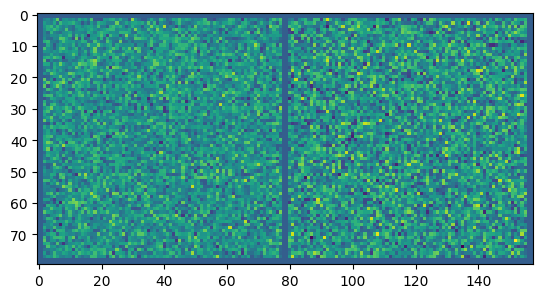

In [21]:
show_imgs(x_gen)

## One optimisation loop

In [22]:
# create a new instance of D and G
D = Discriminator()
G = Generator()
# Define to loss function V (known as Binary Cross Entropy):
criterion = nn.BCELoss()
# Define stochastic gradient descent optimisation
optimizerD = torch.optim.SGD(D.parameters(), lr=0.01)
optimizerG = torch.optim.SGD(G.parameters(), lr=0.01)

In [23]:
# STEP 1: Discriminator optimization step
x_real, _ = next(iter(dataloader_pyapd))
lab_real = torch.ones(bs, 1)
lab_fake = torch.zeros(bs, 1)
# reset accumulated gradients from previous iteration
optimizerD.zero_grad()
D_x = D(x_real)
lossD_real = criterion(D_x, lab_real)

z = torch.randn(bs, g_dim) # random new sample
x_gen = G(z).detach()
D_G_z = D(x_gen)
lossD_fake = criterion(D_G_z, lab_fake)

lossD = lossD_real + lossD_fake
lossD.backward()
optimizerD.step()

print(D_x.mean().item(), D_G_z.mean().item())

0.47914770245552063 0.5003165602684021


In [24]:
# STEP 2: Generator optimization step

# reset accumulated gradients from previous iteration
optimizerG.zero_grad()

z = torch.randn(bs, g_dim) # random new sample
D_G_z = D(G(z))
lossG = criterion(D_G_z, lab_real)

lossG.backward() # helpful for computing gradients
optimizerG.step()

print(D_G_z.mean().item())

0.48611366748809814


## Full training procedure

In [25]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print('Device: ', device)
# Re-initialize D, G:
D = Discriminator().to(device)
G = Generator().to(device)
# Define stochastic gradient descent optimisation
#optimizerD = torch.optim.SGD(D.parameters(), lr=0.03)
#optimizerG = torch.optim.SGD(G.parameters(), lr=0.03)
# ADAM = ADAptive Moment estimation, more sophisticated stochastic gradient approach
optimizerD = torch.optim.Adam(D.parameters(), lr=0.0002)
optimizerG = torch.optim.Adam(G.parameters(), lr=0.0002)
lab_real = torch.ones(bs, 1, device=device)
lab_fake = torch.zeros(bs, 1, device=device)

# for logging:
collect_x_gen = []
fixed_noise = torch.randn(bs, g_dim, device=device)
#fig = plt.figure() # keep updating this one
#plt.ion();

Device:  cpu


In [26]:
for epoch in range(50): # we can run this cell repeatedly to run extra epochs
    for i, data in enumerate(dataloader_pyapd, 0):
        # STEP 1: Discriminator optimization step
        x_real, _ = next(iter(dataloader_pyapd))
        x_real = x_real.to(device)
        optimizerD.zero_grad() # reset accumulated gradients from previous iteration
        D_x = D(x_real)
        lossD_real = criterion(D_x, lab_real)
        z = torch.randn(bs, g_dim, device=device) # random new sample
        x_gen = G(z).detach()
        D_G_z = D(x_gen)
        lossD_fake = criterion(D_G_z, lab_fake)
        lossD = lossD_real + lossD_fake
        lossD.backward() # helpful for computing gradients
        optimizerD.step()
        # STEP 2: Generator optimization step
        optimizerG.zero_grad() # reset accumulated gradients from previous iteration
        z = torch.randn(bs, g_dim, device=device) # random new sample
        x_gen = G(z)
        D_G_z = D(x_gen)
        lossG = criterion(D_G_z, lab_real)
        lossG.backward() # helpful for computing gradients
        optimizerG.step()
        if i % 100 == 0:
            x_gen = G(fixed_noise)
            print('e{}.i{}/{} last mb D(x)={:.4f} D(G(z))={:.4f}'.format(
                epoch, i, len(dataloader_pyapd), D_x.mean().item(), D_G_z.mean().item()))
    # End of epoch
    x_gen = G(fixed_noise)
    collect_x_gen.append(x_gen.detach().clone())

e0.i0/886 last mb D(x)=0.4816 D(G(z))=0.4305
e0.i100/886 last mb D(x)=0.9730 D(G(z))=0.3758
e0.i200/886 last mb D(x)=0.9666 D(G(z))=0.0900
e0.i300/886 last mb D(x)=0.9424 D(G(z))=0.0677
e0.i400/886 last mb D(x)=0.8875 D(G(z))=0.0453
e0.i500/886 last mb D(x)=0.9597 D(G(z))=0.0237
e0.i600/886 last mb D(x)=0.9786 D(G(z))=0.0672
e0.i700/886 last mb D(x)=0.9779 D(G(z))=0.0712
e0.i800/886 last mb D(x)=0.9903 D(G(z))=0.2559
e1.i0/886 last mb D(x)=0.9954 D(G(z))=0.2507
e1.i100/886 last mb D(x)=0.9926 D(G(z))=0.2160
e1.i200/886 last mb D(x)=0.9944 D(G(z))=0.1479
e1.i300/886 last mb D(x)=0.9915 D(G(z))=0.1189
e1.i400/886 last mb D(x)=0.9983 D(G(z))=0.1398
e1.i500/886 last mb D(x)=0.9959 D(G(z))=0.1168
e1.i600/886 last mb D(x)=0.9763 D(G(z))=0.1281
e1.i700/886 last mb D(x)=0.9924 D(G(z))=0.1031
e1.i800/886 last mb D(x)=0.9996 D(G(z))=0.0728
e2.i0/886 last mb D(x)=0.9997 D(G(z))=0.0526
e2.i100/886 last mb D(x)=0.9993 D(G(z))=0.0463
e2.i200/886 last mb D(x)=0.9996 D(G(z))=0.0448
e2.i300/886 last mb

In [ ]:
#for x_gen in collect_x_gen:
#    show_imgs(x_gen)

In [ ]:
#new_input = torch.randn(bs, g_dim, device=device)
#show_imgs(G(new_input))

## Pre-computed result

If we run the optimisation for 30 epochs (it takes a bit of time), we observe the following progress:

<ipython-input-9-58c10dce72f1>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


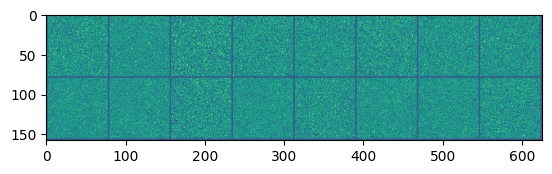

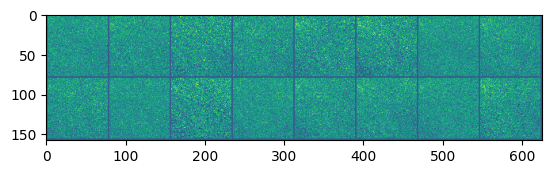

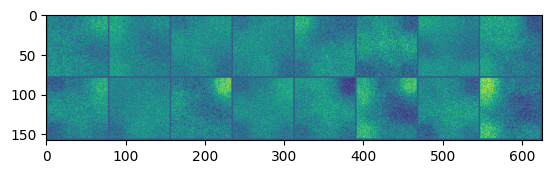

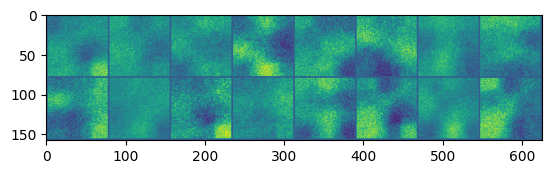

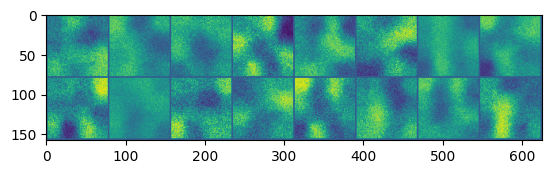

...

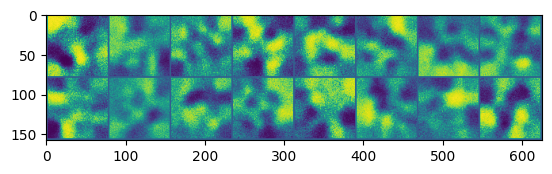

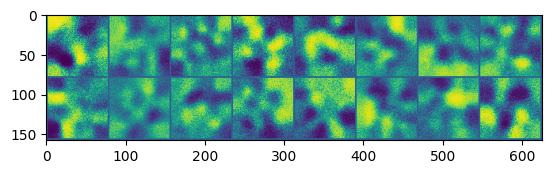

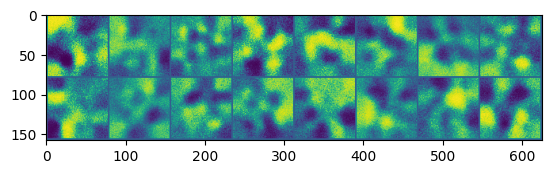

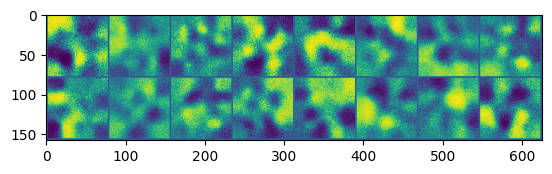

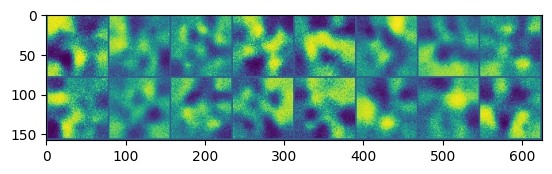

In [27]:
for x_gen in collect_x_gen:
    show_imgs(x_gen)

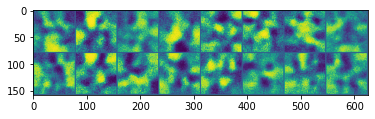

In [ ]:
new_input = torch.randn(bs, g_dim, device=device)
show_imgs(G(new_input))

## Summary

- Generative Adversarial Networks are a generative AI framework that is capable of generating artificial images that are similar to data it is trained on.
- It is a competition between two neural network functions, the discriminator and the generator. The generator is trying to fool the discriminator into thinking images it creates are real. The discriminator aims to distinguish real data from anything else.
- It involves high-dimensional optimisation of parameters defining the two functions, it needs stochastic gradient methods and a lot of computing resources (hence the sky-rocketing demand for GPUs)
- It works pretty well!
- We have looked at a simple "vanilla" GAN framework, a lot of further progress in the last 5-7 years.

## Homework

(1) What features of the data does the Generator function seem to get right after, say, 10 epochs of optimisation?

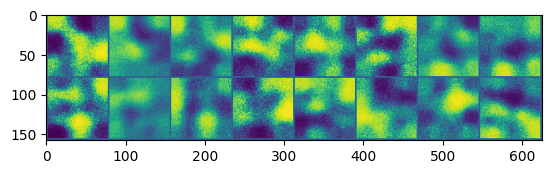

In [131]:
result1 = collect_x_gen[9]
show_imgs(result1)

***The characteristics of graph is vague, but the edges of each area becomes clear.***


(2) What features of the data does the Generator function seem to struggle to get right even after, say, 20 epochs of optimisation?

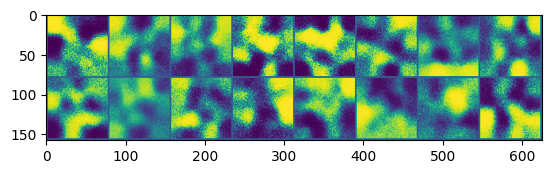

In [132]:
result2 = collect_x_gen[19]
show_imgs(result2)

The features of each areas become clearer than previous one.

(3) The discriminator function is meant to distinguish between "real" data and the data artificially generated. What score do you expect it to assign to a new image generated by PyAPD, but one which was not in the training data? Explain why you think that.

*The expected score is 0. As it is a competitive model, including generator and discriminator, the discriminator cannot recognize the reality of a graph genearated by genearator model, but it cannot recognize the graph generated by PyAPD unless it is super similar to the graphs we feed to computer. However, it is a random generator, and suppose all the outcomes are uniform distributed, the probability that discriminator that recognize is very low, namely, that is  0*.

(4) More involved: verify the answer to question (3) by writing code which creates a new image using PyAPD with the same number of pixels (76x76) and with pixel values scaled to be between -1 and 1 and passes it to the trained discriminator for evaluation. This should be doable by reusing code from Part 1.

In [125]:
apd1 = PyAPD.apd_system(
    N=15, # number of grains
    ani_thres=0.5, # anisotropy parameter
    # pixel_size_prefactor=5, # create this times as many pixels (good for nice plots)
    )
apd1.assemble_pixels() # defining the pixels

apd1.Lloyds_algorithm( # # algorithm for generating nice microstructure
    K=10, # number of iterations
)

Lloyds iteration: 0
Optimality condition successfully overwritten.
The APD is optimal!
Percentage error =  0.27722862362861633
Lloyds iteration: 1
Optimality condition successfully overwritten.
The APD is optimal!
Percentage error =  0.5369223356246948
Lloyds iteration: 2
Optimality condition successfully overwritten.
The APD is optimal!
Percentage error =  0.7615461349487305
Lloyds iteration: 3
Optimality condition successfully overwritten.
The APD is optimal!
Percentage error =  0.7615461349487305
Lloyds iteration: 4
Optimality condition successfully overwritten.
The APD is optimal!
Percentage error =  0.5369223356246948
Lloyds iteration: 5
Optimality condition successfully overwritten.
The APD is optimal!
Percentage error =  0.7966160774230957
Lloyds iteration: 6
Optimality condition successfully overwritten.
The APD is optimal!
Percentage error =  0.7966160774230957
Lloyds iteration: 7
Optimality condition successfully overwritten.
The APD is optimal!
Percentage error =  0.76154613

tensor([[0.5000, 0.5000, 0.5000,  ..., 0.2143, 0.2143, 0.2143],
        [0.5000, 0.5000, 0.5000,  ..., 0.2143, 0.2143, 0.2143],
        [0.5000, 0.5000, 0.5000,  ..., 0.2143, 0.2143, 0.2143],
        ...,
        [0.0714, 0.0714, 0.0714,  ..., 1.0000, 1.0000, 1.0000],
        [0.0714, 0.0714, 0.0714,  ..., 1.0000, 1.0000, 1.0000],
        [0.0714, 0.0714, 0.0714,  ..., 1.0000, 1.0000, 1.0000]])


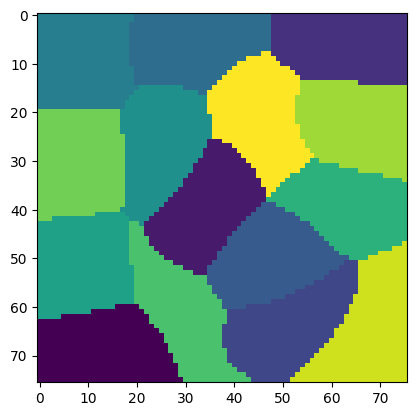

In [126]:
# write your code here
img = apd1.assemble_apd().reshape(apd1.pixel_params).transpose(0,1).cpu()
img_s = (img + 1)/img.max() #shift values to [0,1]
plt.imshow(img_s)
print(img_s)

In [127]:
img_s = img_s.unsqueeze(0)
img_s = img_s.unsqueeze(1)
img_s = img_s.repeat(3, 1, 1, 1)
n = transforms.Normalize((0.5,), (0.5,))
img_s = n(img_s)
img_s.shape

torch.Size([3, 1, 76, 76])

In [128]:
D(img_s)

tensor([[1.1889e-27],
        [1.1889e-27],
        [1.1889e-27]], grad_fn=<SigmoidBackward0>)